# Lab Two Exploring Image Data
## Team member
Rongwei Ji, Jonathan Mejia, Xiaoqing Zou
## Data introduction 
Data source: https://www.kaggle.com/datasets/yousefmohamed20/oxford-102-flower-dataset

Data file name:  Lab2/flowers/102 flower

1 folder and 1 JSON file, the folder named flowers contains the images categorized as test, train, valid data (We will be using the train data in this lab). The file named cat_to_name.json will hold all respective values to each to represent as labels to each image.


## Environment
python 3.11.5, conda 23.9.0 ,numpy-1.26.3 pandas-2.2.0 pytz-2023.4 tzdata-2023.4, pip-23.3.2 matplotlib: 3.8.2

## Something more
Kaggal generate new dataset form the original one by the Deep learning about 20758 rows: https://www.kaggle.com/competitions/playground-series-s4e2/data and can using it do more. 
data/train.csv



# 1.Business Understanding
## Purpose of the Dataset:
The primary purpose of collecting the Oxford-102 Flower dataset is to provide a benchmark for researchers and practitioners in the field of computer vision and machine learning, particularly in the domain of fine-grained image classification. Fine-grained classification involves distinguishing between closely related categories, such as different species of flowers, which can be a challenging task due to subtle visual differences.

## Prediction Task:
The prediction task for this dataset involves building a model that can accurately classify images of flowers into one of the 102 predefined categories. Third parties interested in the results of this prediction task include botanists, ecologists, agricultural scientists, florists, and hobbyists interested in flower identification.

## Importance of the Data:
This dataset is important for several reasons. Firstly, it serves as a benchmark for evaluating the performance of various computer vision algorithms in fine-grained classification tasks. Secondly, accurate flower classification models can have practical applications in fields such as agriculture, biodiversity monitoring, and horticulture. Thirdly, understanding the characteristics and distribution of different flower species can contribute to ecological research and conservation efforts.

## Performance Expectations:
For the prediction algorithm to be considered useful to the identified third parties, it would need to achieve a high level of accuracy in classifying flowers. Since misclassification could have real-world consequences, such as misidentifying a harmful weed as a benign flower species, the model would need to perform with high precision and recall, ideally achieving accuracy rates well above 90%. Additionally, the model should be able to generalize well to unseen data and exhibit robustness to variations in lighting, background, and orientation of the flowers in the images.









In [6]:
a = imread(f'{i[0]}', 'r')
a = np.array(a)
print(a.shape)

(753, 500)


# 2. Data Preparation

In [4]:
from sklearn.datasets import load_files
from skimage.io import imread
from skimage.transform import resize
import numpy as np
import re
import glob

i = glob.glob("./*/102 flower/flowers/train/*/*.jpg")
pattern = r"[0-9]+/"
data = []
images = []
targets = []
for j in i:
    # Resize and recolor images as necessary.
    im = resize(imread(f'{j}', 'r'),(100,100))
    images.append(im)
    # Linearize the images to create a table of 1-D
    # image features (each row should be one image). 
    matches = re.search(pattern,j)
    targets.append(int(matches.group(0)[:-1]))
    data.append(im.flatten()) 
    
# Read in your images as numpy arrays.
targets = np.array(targets)
data = np.array(data)
images = np.array(images)
print(data.shape)
print(images.shape)

(6552, 10000)
(6552, 100, 100)


In [15]:
import json

f = glob.glob("./*/102 flower/cat_to_name.json")
with open(f[0],'r') as file:
    val = json.load(file)

In [16]:
X = data 
y = np.array(targets)
names = list(val.keys())
n_classes = len(names)
n_samples, n_features = data.shape
_,h,w = images.shape
print(np.sum(~np.isfinite(X)))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print ("The size of each image to be displayed:", h*w) 

0
n_samples: 6552
n_features: 10000
n_classes: 102
Original Image Sizes 100 by 100
The size of each image to be displayed: 10000


In [17]:
import pandas as pd

df = pd.DataFrame(y)
index = df.drop_duplicates()

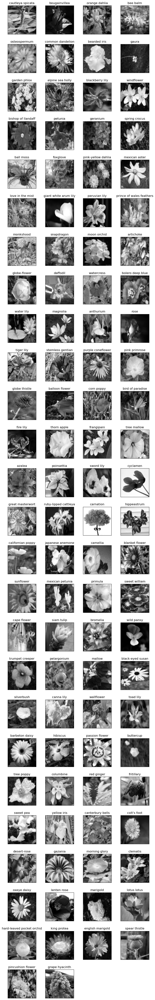

In [18]:
import matplotlib.pyplot as plt
import math as mt


def plot_gallery(data, titles, h, w, n_row=30, n_col=4):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(2 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    counter = 0
    for i in titles:
        plt.subplot(n_row, n_col, counter + 1)
        counter+=1
        plt.imshow(data[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(val[str(df.iloc[i,0])] , size=12)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X, index.index, h, w)


# Data Reduction
Perform linear dimensionality reduction of the images using principal components analysis. Visualize the explained variance of each component. Analyze how many dimensions are required to adequately represent your image data. Explain your analysis and conclusion.

In [19]:
from sklearn.decomposition import PCA

n_components = 1000
print ("Extracting the top %d eigenfaces from %d faces" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenfaces = pca.components_.reshape((n_components, h, w))

Extracting the top 1000 eigenfaces from 6552 faces
CPU times: user 1min 47s, sys: 2.53 s, total: 1min 50s
Wall time: 16.6 s


In [20]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

In [21]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns


plot_explained_variance(pca)

In [22]:
def plot_gallery_test(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())


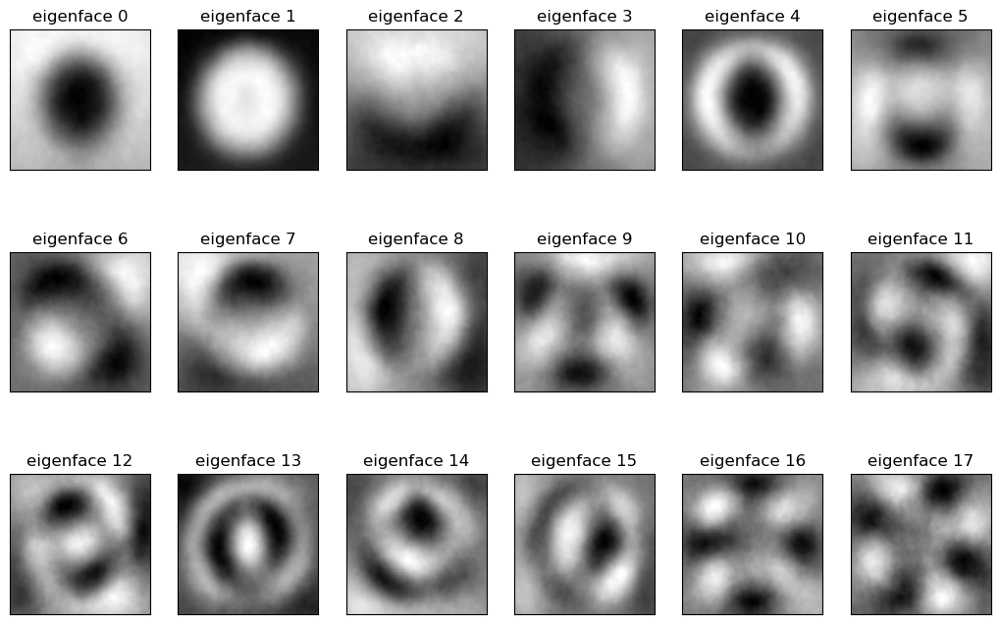

In [23]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery_test(eigenfaces, eigenface_titles, h, w)

In [24]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

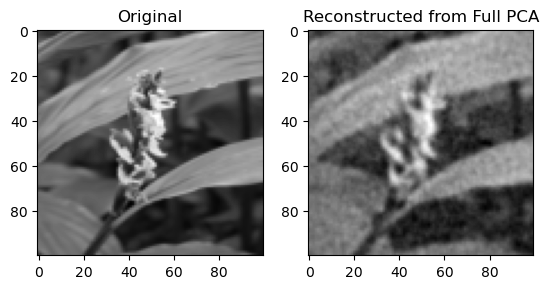

In [25]:
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

# Point 2

Perform linear dimensionality reduction of your image data using randomized principle components analysis. Visualize the explained variance of each component. Analyze how many dimensions are required to adequately represent your image data. Explain your analysis and conclusion.

In [26]:
n_components = 1000
print ("Extracting the top %d eigenfaces from %d faces" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenfaces = rpca.components_.reshape((n_components, h, w))

Extracting the top 1000 eigenfaces from 6552 faces
CPU times: user 1min 58s, sys: 2.88 s, total: 2min
Wall time: 19.8 s


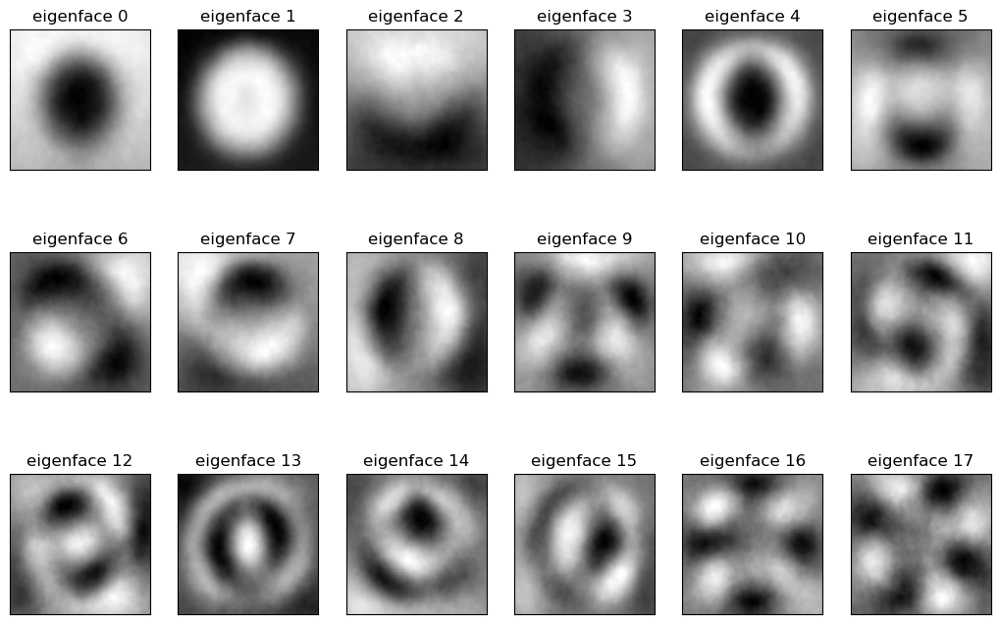

In [27]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery_test(eigenfaces, eigenface_titles, h, w)

In [28]:
plot_explained_variance(rpca)
plot_explained_variance(pca)

In [29]:
import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)



def plt_reconstruct(idx_to_reconstruct):
    # this code is for reference only, it does not qualify as a neaarest neighbor search
    #  for your lab project. 
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(val[str(names[y[idx_to_reconstruct]])]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(1,3,2) # pca
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(1,3,3) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)
    plt.show()
    

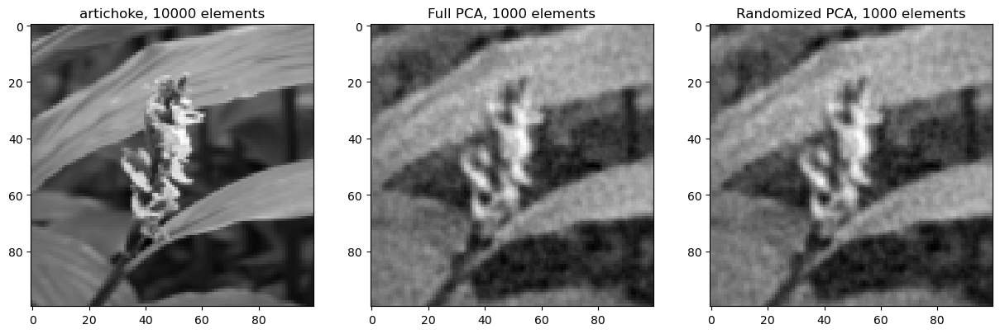

In [30]:
idx_to_reconstruct = 1    
plt_reconstruct(idx_to_reconstruct)

# Point 3
Compare the representation using PCA and Randomized PCA. The method you choose to compare dimensionality methods should quantitatively explain which method is better at representing the images with fewer components.  Do you prefer one method over another? Why?

# Point 4 

Perform feature extraction upon the images using any feature extraction technique (e.g., gabor filters, ordered gradients, DAISY, etc.).

# skimage.feature.daisy








#### parameter EXAMPLE
daisy(image, step=4, radius=15, rings=3, histograms=8,orientations=8, normalization='l1', sigmas=None, ring_radii=None, visualize=False)

## Key Parameters

* image: (M, N) array
  * Input image (grayscale).

* step: int, optional
  * Distance between descriptor sampling points.

* radius: int, optional
  * Radius (in pixels) of the outermost ring.

* rings: int, optional
  * Number of rings.

* histograms: int, optional
  * Number of histograms sampled per ring.

* orientations: int, optional
  * Number of orientations (bins) per histogram.

* normalization: [ ‘l1’ | ‘l2’ | ‘daisy’ | ‘off’ ], optional

  * ‘l1’: L1-normalization of each descriptor.

  * ‘l2’: L2-normalization of each descriptor.

  * ‘daisy’: L2-normalization of individual histograms.

  * ‘off’: Disable normalization.


DETAILS

https://scikit-image.org/docs/stable/api/skimage.feature.html


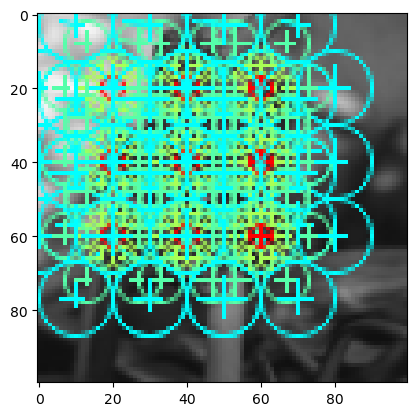

In [37]:
from pylab import *
from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(im, 
                           step=20, 
                           radius=20, 
                           rings=3, 
                           histograms=6, 
                           orientations=4, 
                           visualize=True)
imshow(img_desc)
plt.grid(False)
plt.show()

In [38]:
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(3, 3, 76)
684


In [39]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=10, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: user 19.3 ms, sys: 2.95 ms, total: 22.2 ms
Wall time: 20.7 ms


(2448,)

In [40]:
0.026 * len(X) # approximate how long it may run

170.352

In [41]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 30 s, sys: 3.82 s, total: 33.9 s
Wall time: 34.3 s
(6552, 2448)


In [42]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: user 6.32 s, sys: 168 ms, total: 6.49 s
Wall time: 991 ms


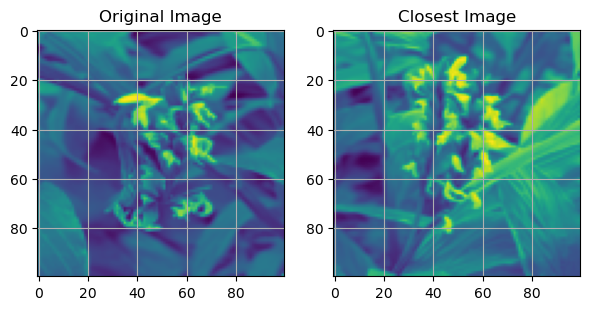

In [43]:
import copy
# find closest image to current image
idx1 = 3
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [44]:
pca_obj = PCA(n_components=3000)
X_pca_features = pca_obj.fit_transform(X)

In [49]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# init a classifier for each feature space
knn_pca = KNeighborsClassifier(n_neighbors=3)
knn_dsy = KNeighborsClassifier(n_neighbors=3)

# separate the data into train/test
pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_features,daisy_features, y, test_size=0.2, train_size=0.8)

# fit each classifier
knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

# report accuracy
print(f"PCA accuracy:{100*acc_pca:.2f}%, Daisy Accuracy:{100*acc_dsy:.2f}%".format())

PCA accuracy:6.94%, Daisy Accuracy:9.00%


# Exceptional Work

In [46]:
# for the exceptional credit, you might be interested in the following code
# you will need to repeat this for all pairs of images in the testing and training 
from skimage.feature import match_descriptors

def apply_daisy(row,shape): # no reshape in this function
    feat = daisy(row.reshape(shape), step=5, radius=5, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    s = feat.shape # PxQxR
    #P = ceil((Height - radius*2) / step) 
    #Q = ceil((Width - radius*2) / step) 
    #R = (rings * histograms + 1) * orientations
    return feat.reshape((s[0]*s[1],s[2]))

d1 = apply_daisy(X[10],(h,w))
d2 = apply_daisy(X[11],(h,w))
d3 = apply_daisy(X[0],(h,w))

print(d1.shape, d2.shape, d3.shape)
print('Classes:',y[10],y[11],y[0])

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d2, cross_check=True, max_ratio=0.8)
print(f"Number of matches, same class: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d3, cross_check=True, max_ratio=0.8)
print(f"Number of matches, diff classes: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

(324, 68) (324, 68) (324, 68)
Classes: 61 61 61
Number of matches, same class: 9, Percentage:2.78%
Number of matches, diff classes: 13, Percentage:4.01%
